In [1]:
import PIL
from PIL import Image
import os
from tqdm.notebook import tqdm
from time import time
import torch
import torchvision
import torchvision.models as models
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [2]:
img = Image.open('00_001.png')
img = img.convert('RGB')
new_img = img.resize((224,224))
new_img.save("flower_resized.png", "JPEG", optimize=True)

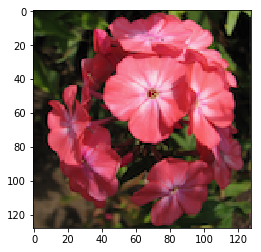

In [3]:
img = Image.open("00_001.png")
plt.imshow(img)

(224, 224, 3)


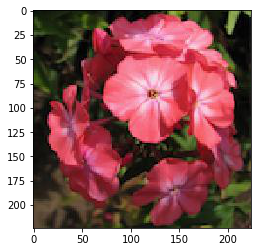

In [4]:
img = Image.open("flower_resized.png")
arr = np.array(img)
print(arr.shape)
arr2im = Image.fromarray(arr, "RGB")
plt.imshow(arr2im)

In [5]:
def loadImg_Resize_ToArray(imgPath):
    img = Image.open(imgPath)
    img = img.convert('RGB')
    new_img = img.resize((224,224))
    arr = np.array(new_img)
    return arr

In [6]:
device = torch.device("cpu")
root_dir = os.getcwd()
data_dir = os.path.join(root_dir, "flowers\\flowers")

In [7]:
model = models.vgg16(pretrained=True)

In [8]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [9]:
model.classifier = nn.Sequential(*list(model.classifier.children())[:-3])

In [10]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [11]:
def feature_extraction(model, arr):
    arr = arr.astype(np.float32)
    inputImg = torch.tensor(arr.transpose((2, 0, 1)))
    output = model(inputImg[None, ...]).detach().numpy()
    return output

In [12]:
os.chdir(data_dir)
noOfData = len(os.listdir())
print(noOfData)

603


In [13]:
data = np.empty(shape=[noOfData, 224, 224, 3])
labels = np.empty(shape=[noOfData, 1])
filenames = []

for i,imgPath in enumerate(os.listdir()):
    classSplit = imgPath.split("_")
    classIndex = classSplit[0]
    
    img = loadImg_Resize_ToArray(imgPath)
    data[i] = img
    labels[i] = int(classIndex)
    filenames.append(imgPath)

In [14]:
unique_labels = np.unique(labels)
noOfUniqueLabels = len(unique_labels)
print(unique_labels)
print(f"number of unique labels is : {len(unique_labels)}")

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19.]
number of unique labels is : 20


In [15]:
N_CHANNELS = 3

before = time()
mean = np.zeros(3)
std = np.zeros(3)
print('==> Computing mean and std..')
for k in tqdm(range(len(data))):
    inputs = data[k]
    for i in range(N_CHANNELS):
        mean[i] += inputs[:,:,i].mean()
        std[i] += inputs[:,:,i].std()
mean = mean / len(data)
std = std / len(data)
print(mean, std)

print("time elapsed: ", time()-before)

==> Computing mean and std..


  0%|          | 0/603 [00:00<?, ?it/s]

[113.73776876 104.54146043  82.65720845] [72.22761755 60.24891297 60.49286802]
time elapsed:  0.4512040615081787


In [16]:
normalizedData = (data - mean) / std

In [17]:
featuresData = np.empty(shape=[noOfData, 4096])
for i,arr in enumerate(normalizedData):
    features = feature_extraction(model,arr)
    featuresData[i] = features   

In [18]:
print(featuresData.shape)
print(featuresData[0])

(603, 4096)
[-4.12076664  0.40498328  1.26648664 ... -3.85684776  0.36986253
 -2.35792065]


In [19]:
pca = PCA(n_components=200, random_state=22)
pca.fit(featuresData)
x = pca.transform(featuresData)

In [20]:
print(x.shape)
print(type(x))

(603, 200)
<class 'numpy.ndarray'>


In [21]:
kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
kmeans.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=20, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=22, tol=0.0001, verbose=0)

In [22]:
len(kmeans.labels_)
print(kmeans.labels_[0])
print(kmeans.labels_[1])
print(kmeans.labels_[210])

1
19
4


In [23]:
groups = {}
for imgPath, clusterLabel in zip(filenames,kmeans.labels_):
    if clusterLabel not in groups.keys():
        groups[clusterLabel] = []
        groups[clusterLabel].append(imgPath)
    else:
        groups[clusterLabel].append(imgPath)

In [24]:
groups[0]

['00_006.png',
 '00_023.png',
 '00_029.png',
 '00_030.png',
 '04_002.png',
 '05_005.png',
 '05_008.png',
 '05_009.png',
 '05_014.png',
 '05_016.png',
 '05_018.png',
 '05_021.png',
 '05_031.png',
 '05_040.png',
 '05_042.png',
 '05_047.png',
 '05_048.png',
 '06_001.png',
 '06_002.png',
 '06_007.png',
 '06_009.png',
 '06_025.png',
 '06_026.png',
 '08_027.png',
 '12_015.png',
 '13_001.png',
 '13_002.png',
 '13_005.png',
 '13_008.png',
 '13_010.png',
 '16_025.png',
 '16_026.png',
 '16_028.png',
 '16_040.png',
 '17_005.png',
 '17_032.png',
 '19_006.png',
 '19_008.png',
 '19_009.png']

In [25]:
for key in groups.keys():
    print(f"number of data in the cluster {key} is: {len(groups[key])}")

number of data in the cluster 1 is: 7
number of data in the cluster 19 is: 37
number of data in the cluster 14 is: 44
number of data in the cluster 0 is: 39
number of data in the cluster 11 is: 43
number of data in the cluster 6 is: 42
number of data in the cluster 4 is: 38
number of data in the cluster 7 is: 40
number of data in the cluster 2 is: 52
number of data in the cluster 10 is: 26
number of data in the cluster 16 is: 38
number of data in the cluster 15 is: 21
number of data in the cluster 8 is: 47
number of data in the cluster 18 is: 35
number of data in the cluster 13 is: 32
number of data in the cluster 9 is: 21
number of data in the cluster 5 is: 19
number of data in the cluster 3 is: 7
number of data in the cluster 17 is: 13
number of data in the cluster 12 is: 2


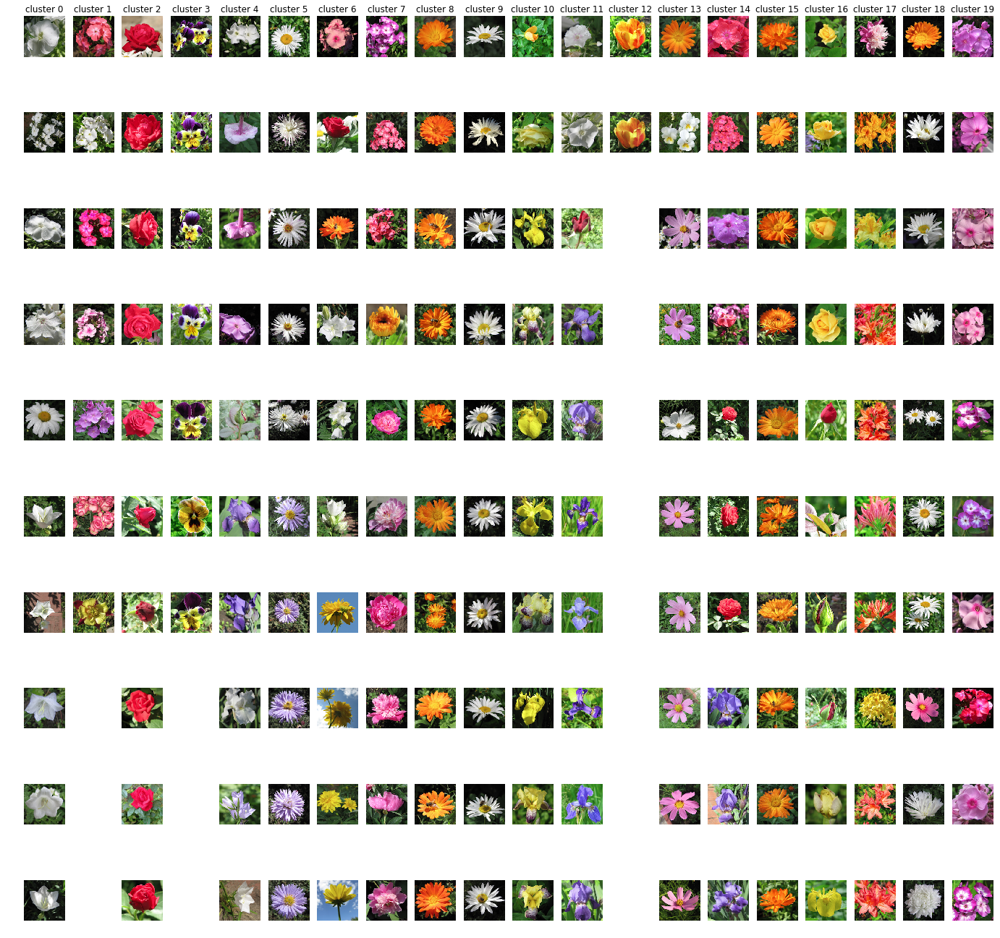

In [26]:
num_classes = len(groups)
plt.figure(figsize=(24,24))
rowNumber = 10

for y in range(num_classes):
    if len(groups[y]) < 10:
        samples_per_class = len(groups[y])
    else:
        samples_per_class = 10
    for i in range(samples_per_class):
        plt_idx = i * num_classes + y + 1
        plt.subplot(rowNumber, num_classes, plt_idx)
        image = PIL.Image.open(groups[y][i])
        plt.imshow(image)
        plt.axis('off')
        
        if i == 0:
            plt.title(f"cluster {y}" ,fontsize = 12)
plt.show()

cluster 0
['00_006.png', '00_023.png', '00_029.png', '00_030.png', '04_002.png', '05_005.png', '05_008.png', '05_009.png', '05_014.png', '05_016.png', '05_018.png', '05_021.png', '05_031.png', '05_040.png', '05_042.png', '05_047.png', '05_048.png', '06_001.png', '06_002.png', '06_007.png', '06_009.png', '06_025.png', '06_026.png', '08_027.png', '12_015.png', '13_001.png', '13_002.png', '13_005.png', '13_008.png', '13_010.png', '16_025.png', '16_026.png', '16_028.png', '16_040.png', '17_005.png', '17_032.png', '19_006.png', '19_008.png', '19_009.png']


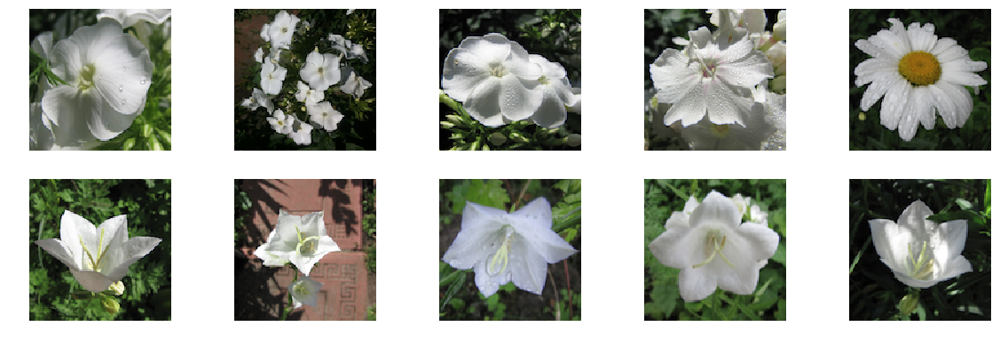

In [27]:
os.chdir(data_dir)

print("cluster 0")
print(groups[0])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[0]) >= 10 else len(groups[0])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[0][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 1
['00_001.png', '00_008.png', '00_013.png', '00_020.png', '00_025.png', '01_016.png', '09_023.png']


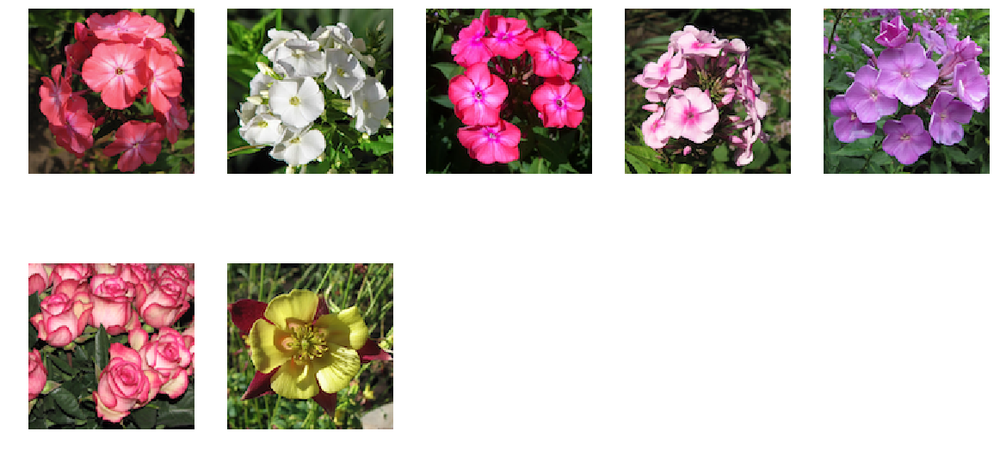

In [28]:
os.chdir(data_dir)

print("cluster 1")
print(groups[1])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[1]) >= 10 else len(groups[1])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[1][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 2
['01_002.png', '01_004.png', '01_005.png', '01_006.png', '01_007.png', '01_008.png', '01_009.png', '01_010.png', '01_011.png', '01_012.png', '01_015.png', '01_017.png', '01_018.png', '01_019.png', '01_021.png', '01_022.png', '01_023.png', '01_024.png', '01_025.png', '01_030.png', '01_032.png', '01_035.png', '01_037.png', '01_038.png', '01_039.png', '01_040.png', '01_041.png', '01_042.png', '01_043.png', '08_008.png', '08_011.png', '08_012.png', '08_015.png', '08_016.png', '08_017.png', '08_020.png', '08_022.png', '08_029.png', '08_030.png', '08_031.png', '08_034.png', '08_037.png', '08_038.png', '08_039.png', '12_002.png', '12_003.png', '12_004.png', '12_008.png', '12_011.png', '12_013.png', '12_014.png', '12_017.png']


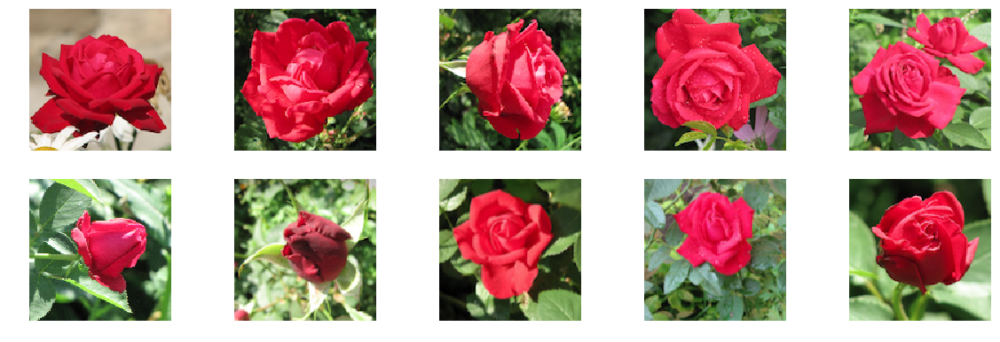

In [29]:
os.chdir(data_dir)

print("cluster 2")
print(groups[2])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[2]) >= 10 else len(groups[2])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[2][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 3
['06_004.png', '06_008.png', '06_014.png', '06_015.png', '06_016.png', '06_021.png', '06_029.png']


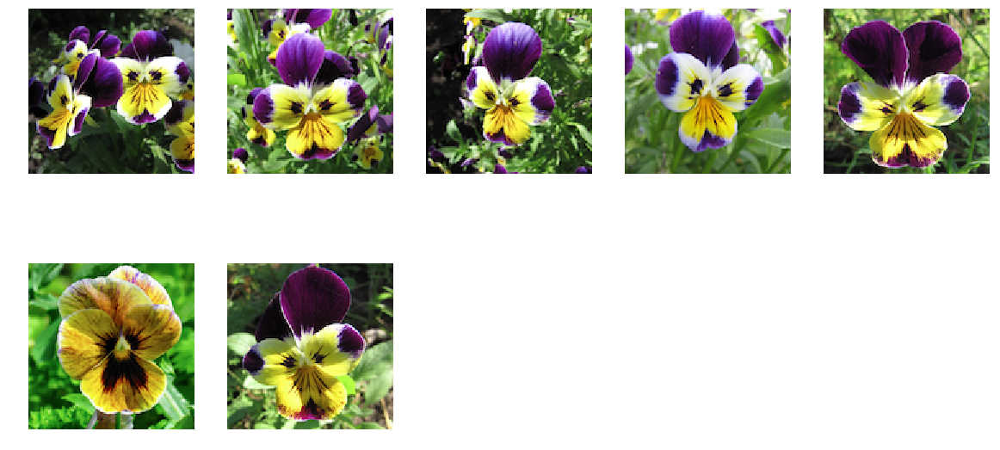

In [30]:
os.chdir(data_dir)

print("cluster 3")
print(groups[3])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[3]) >= 10 else len(groups[3])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[3][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 4
['00_014.png', '00_015.png', '00_017.png', '00_035.png', '01_036.png', '03_001.png', '03_011.png', '03_012.png', '05_003.png', '05_006.png', '05_010.png', '05_012.png', '05_013.png', '05_015.png', '05_019.png', '05_022.png', '05_023.png', '05_025.png', '05_029.png', '05_034.png', '05_038.png', '05_039.png', '05_041.png', '05_044.png', '05_045.png', '06_020.png', '09_003.png', '09_005.png', '09_013.png', '09_015.png', '09_018.png', '09_024.png', '11_010.png', '11_011.png', '12_016.png', '12_018.png', '12_019.png', '16_029.png']


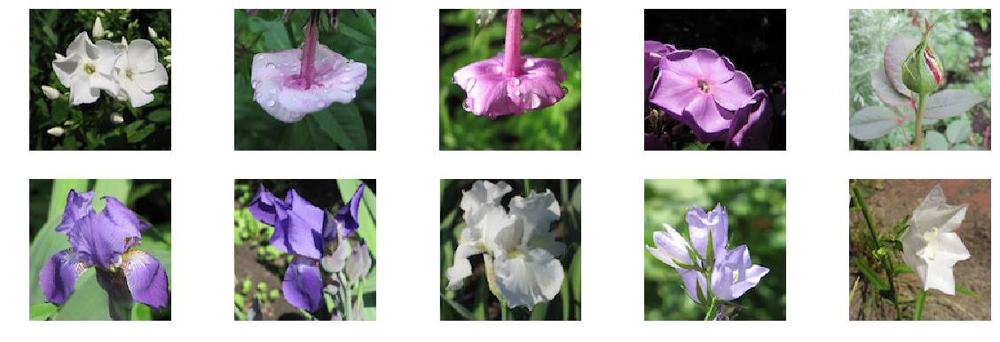

In [31]:
os.chdir(data_dir)

print("cluster 4")
print(groups[4])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[4]) >= 10 else len(groups[4])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[4][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 5
['04_024.png', '18_005.png', '18_008.png', '18_011.png', '18_015.png', '18_017.png', '18_019.png', '18_020.png', '18_021.png', '18_022.png', '18_024.png', '18_026.png', '18_027.png', '18_028.png', '18_029.png', '18_031.png', '18_032.png', '18_033.png', '18_034.png']


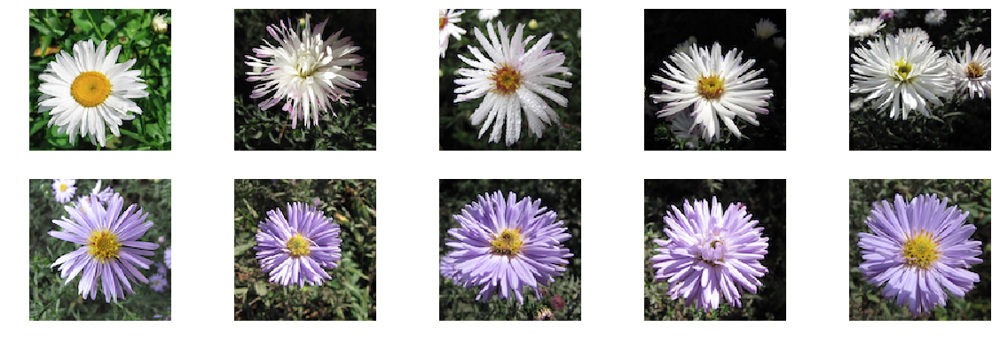

In [32]:
os.chdir(data_dir)

print("cluster 5")
print(groups[5])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[5]) >= 10 else len(groups[5])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[5][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 6
['00_011.png', '01_001.png', '02_027.png', '05_001.png', '05_004.png', '05_037.png', '07_001.png', '07_009.png', '07_011.png', '07_012.png', '07_020.png', '07_026.png', '07_027.png', '11_001.png', '11_002.png', '11_004.png', '11_006.png', '11_007.png', '11_008.png', '11_009.png', '13_004.png', '13_009.png', '13_011.png', '16_008.png', '16_009.png', '16_014.png', '16_018.png', '16_034.png', '17_001.png', '17_003.png', '17_014.png', '17_020.png', '17_030.png', '18_001.png', '18_002.png', '18_016.png', '19_001.png', '19_002.png', '19_003.png', '19_004.png', '19_005.png', '19_007.png']


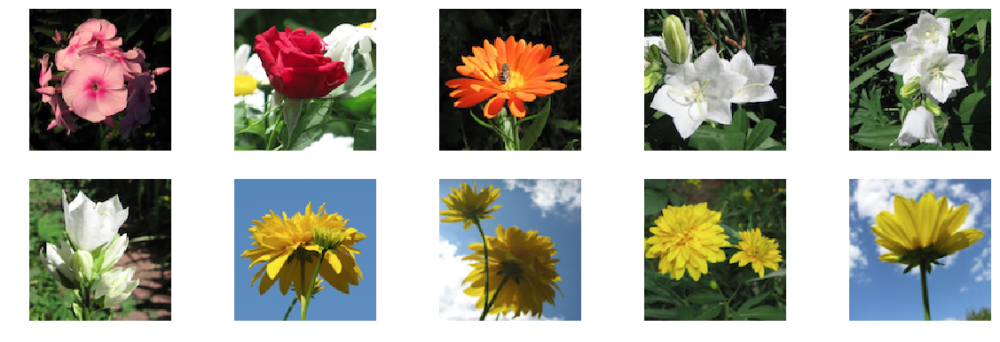

In [33]:
os.chdir(data_dir)

print("cluster 6")
print(groups[6])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[6]) >= 10 else len(groups[6])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[6][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 7
['00_022.png', '00_034.png', '00_042.png', '02_018.png', '08_002.png', '08_003.png', '08_004.png', '08_005.png', '08_007.png', '08_009.png', '08_010.png', '08_013.png', '08_018.png', '08_021.png', '08_025.png', '08_028.png', '08_032.png', '08_033.png', '08_036.png', '08_041.png', '08_042.png', '08_043.png', '09_016.png', '10_009.png', '10_010.png', '10_011.png', '10_012.png', '10_013.png', '10_014.png', '10_022.png', '17_002.png', '17_012.png', '17_024.png', '17_025.png', '17_033.png', '17_035.png', '17_036.png', '17_037.png', '17_039.png', '18_030.png']


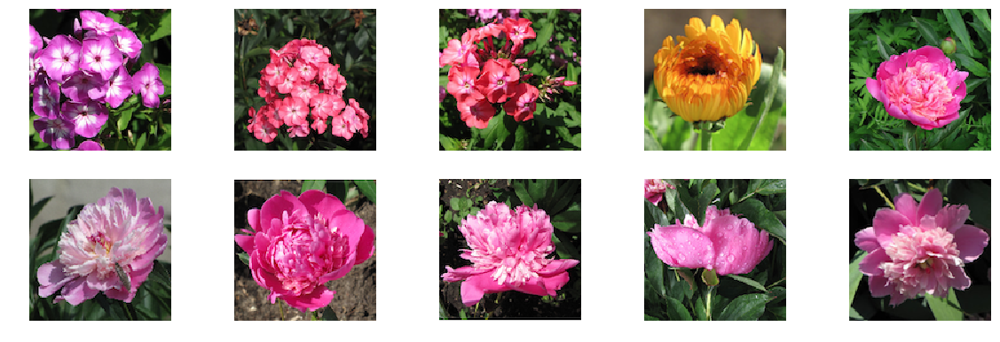

In [34]:
os.chdir(data_dir)

print("cluster 7")
print(groups[7])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[7]) >= 10 else len(groups[7])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[7][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 8
['02_002.png', '02_003.png', '02_005.png', '02_007.png', '02_008.png', '02_014.png', '02_016.png', '02_022.png', '02_026.png', '02_028.png', '02_030.png', '06_005.png', '06_012.png', '06_018.png', '06_023.png', '07_002.png', '07_003.png', '07_004.png', '07_005.png', '07_006.png', '07_007.png', '07_008.png', '07_010.png', '07_013.png', '07_014.png', '07_015.png', '07_016.png', '07_017.png', '07_018.png', '07_019.png', '07_021.png', '07_022.png', '07_023.png', '07_024.png', '07_025.png', '07_028.png', '07_029.png', '07_030.png', '07_031.png', '07_032.png', '07_033.png', '07_034.png', '07_035.png', '16_004.png', '18_018.png', '18_025.png', '19_010.png']


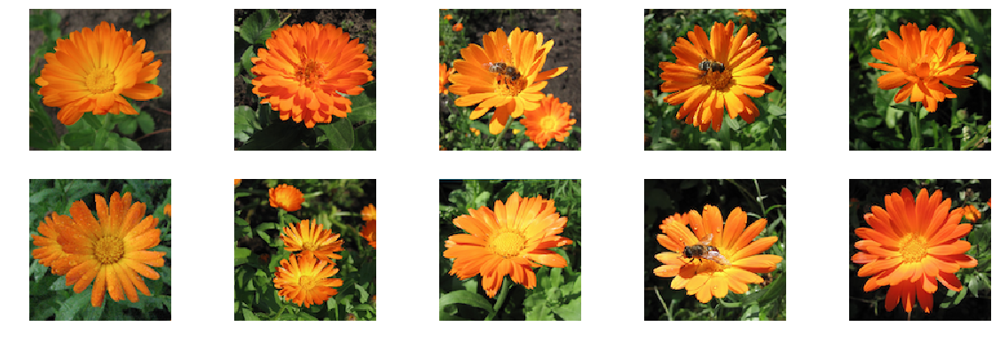

In [35]:
os.chdir(data_dir)

print("cluster 8")
print(groups[8])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[8]) >= 10 else len(groups[8])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[8][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 9
['04_003.png', '04_005.png', '04_006.png', '04_007.png', '04_008.png', '04_009.png', '04_010.png', '04_011.png', '04_012.png', '04_014.png', '04_015.png', '04_016.png', '04_019.png', '04_020.png', '04_021.png', '04_022.png', '04_026.png', '04_027.png', '04_028.png', '04_029.png', '18_012.png']


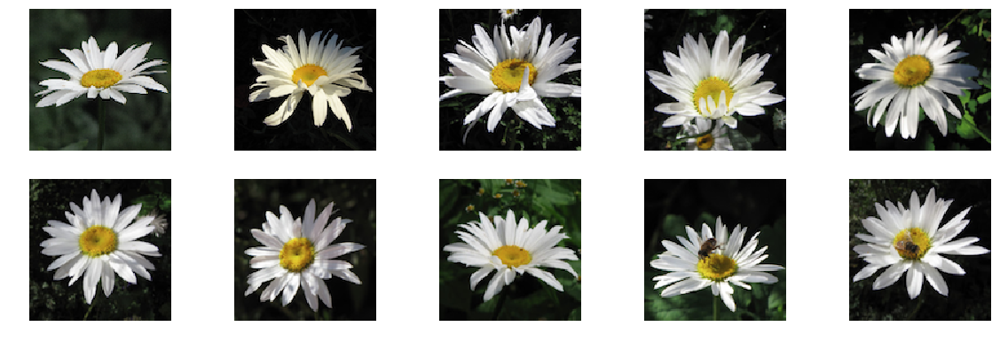

In [36]:
os.chdir(data_dir)

print("cluster 9")
print(groups[9])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[9]) >= 10 else len(groups[9])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[9][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 10
['01_014.png', '01_028.png', '03_002.png', '03_006.png', '03_009.png', '03_010.png', '03_020.png', '03_021.png', '03_035.png', '03_037.png', '03_038.png', '03_039.png', '03_040.png', '09_009.png', '09_011.png', '09_014.png', '09_025.png', '10_003.png', '10_020.png', '12_010.png', '13_003.png', '13_006.png', '13_007.png', '14_006.png', '14_007.png', '14_010.png']


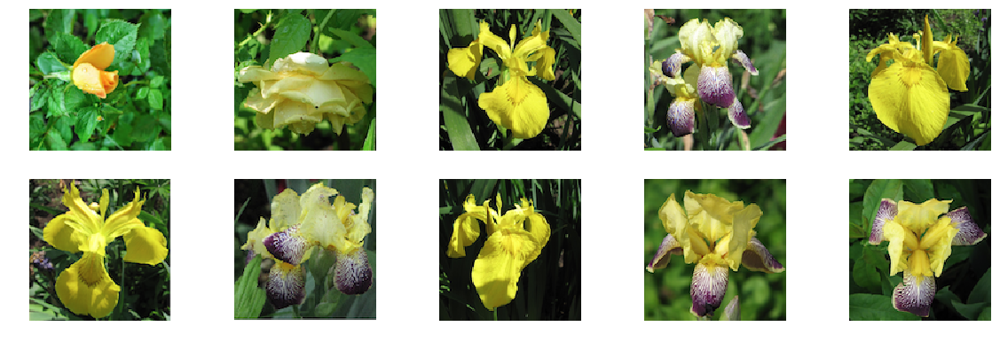

In [37]:
os.chdir(data_dir)

print("cluster 10")
print(groups[10])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[10]) >= 10 else len(groups[10])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[10][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 11
['00_010.png', '00_037.png', '01_013.png', '03_004.png', '03_008.png', '03_015.png', '03_017.png', '03_022.png', '03_024.png', '03_042.png', '05_007.png', '05_011.png', '05_017.png', '05_020.png', '05_024.png', '05_027.png', '05_028.png', '05_032.png', '05_035.png', '05_036.png', '05_043.png', '05_046.png', '06_022.png', '09_002.png', '09_004.png', '09_006.png', '09_008.png', '09_017.png', '15_001.png', '15_002.png', '15_003.png', '15_004.png', '15_005.png', '15_006.png', '15_007.png', '15_008.png', '15_009.png', '15_010.png', '15_011.png', '15_012.png', '15_013.png', '15_014.png', '15_015.png']


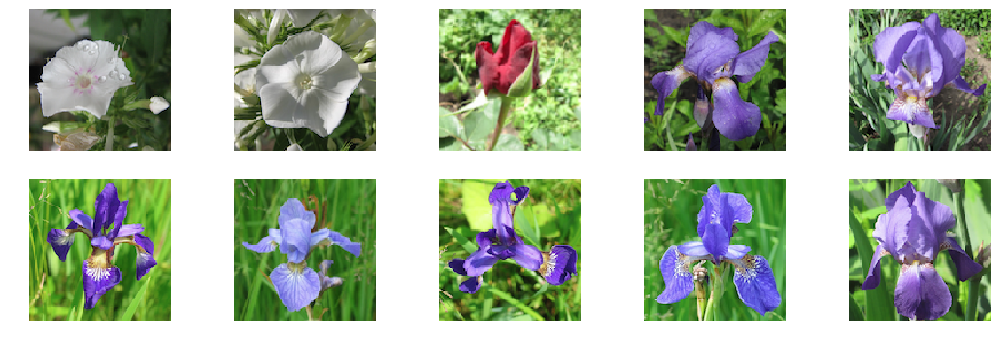

In [38]:
os.chdir(data_dir)

print("cluster 11")
print(groups[11])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[11]) >= 10 else len(groups[11])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[11][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 12
['12_009.png', '12_012.png']


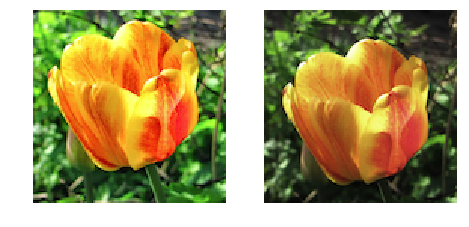

In [39]:
os.chdir(data_dir)

print("cluster 12")
print(groups[12])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[12]) >= 10 else len(groups[12])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[12][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 13
['02_025.png', '06_024.png', '16_001.png', '16_002.png', '16_003.png', '16_005.png', '16_006.png', '16_007.png', '16_011.png', '16_012.png', '16_013.png', '16_019.png', '16_020.png', '16_021.png', '16_022.png', '16_023.png', '16_024.png', '16_027.png', '16_030.png', '16_031.png', '16_032.png', '16_035.png', '16_036.png', '16_037.png', '16_038.png', '16_039.png', '16_042.png', '16_043.png', '16_044.png', '16_045.png', '16_046.png', '16_047.png']


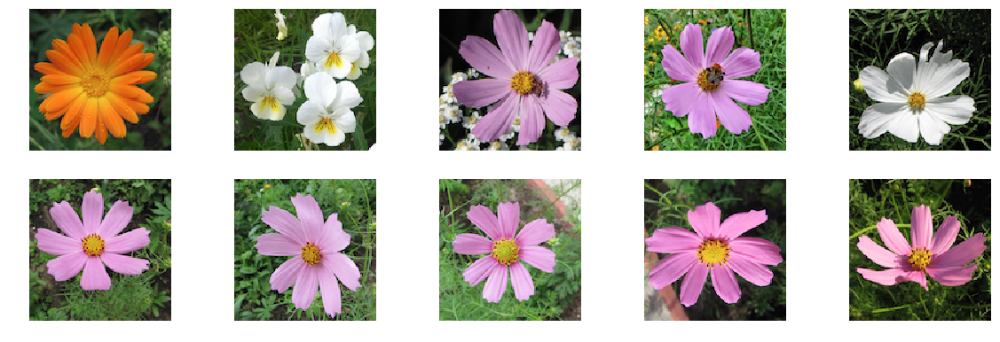

In [40]:
os.chdir(data_dir)

print("cluster 13")
print(groups[13])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[13]) >= 10 else len(groups[13])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[13][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 14
['00_003.png', '00_004.png', '00_018.png', '00_021.png', '01_003.png', '01_044.png', '01_046.png', '03_003.png', '03_007.png', '03_013.png', '03_014.png', '03_016.png', '03_033.png', '03_041.png', '03_044.png', '05_002.png', '06_003.png', '06_010.png', '06_011.png', '06_013.png', '06_017.png', '06_028.png', '08_001.png', '08_014.png', '08_019.png', '08_023.png', '08_024.png', '08_026.png', '08_035.png', '08_040.png', '09_001.png', '09_007.png', '09_019.png', '09_026.png', '09_027.png', '10_007.png', '10_008.png', '11_003.png', '11_005.png', '17_019.png', '17_028.png', '17_029.png', '17_040.png', '18_023.png']


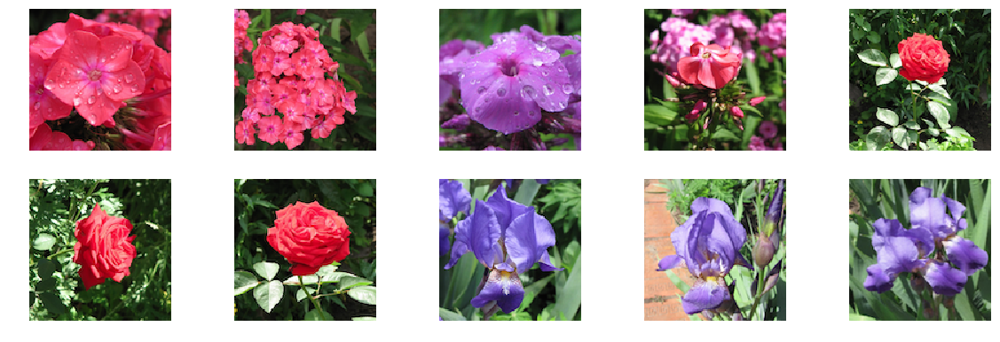

In [41]:
os.chdir(data_dir)

print("cluster 14")
print(groups[14])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[14]) >= 10 else len(groups[14])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[14][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 15
['02_001.png', '02_004.png', '02_006.png', '02_009.png', '02_010.png', '02_011.png', '02_012.png', '02_013.png', '02_015.png', '02_017.png', '02_019.png', '02_020.png', '02_021.png', '02_023.png', '02_029.png', '02_031.png', '02_032.png', '02_033.png', '02_034.png', '02_035.png', '02_036.png']


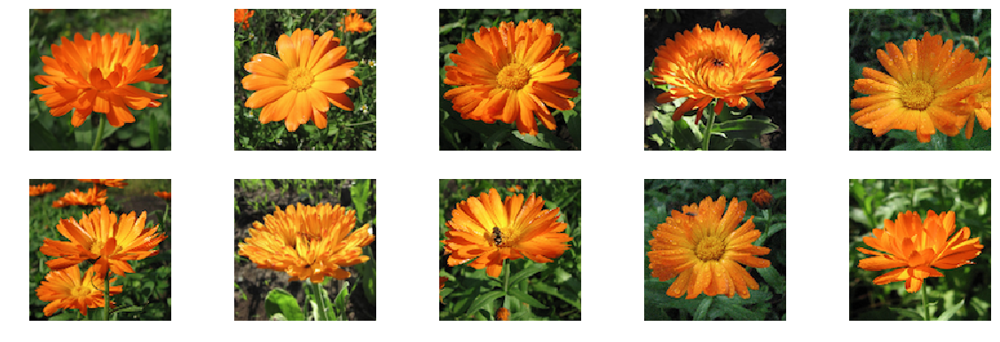

In [42]:
os.chdir(data_dir)

print("cluster 15")
print(groups[15])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[15]) >= 10 else len(groups[15])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[15][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 16
['01_020.png', '01_026.png', '01_027.png', '01_029.png', '01_031.png', '01_033.png', '01_034.png', '01_045.png', '03_018.png', '03_025.png', '03_027.png', '03_028.png', '03_029.png', '03_031.png', '03_032.png', '03_034.png', '03_036.png', '03_045.png', '05_026.png', '05_030.png', '06_027.png', '09_010.png', '09_012.png', '09_020.png', '09_021.png', '09_022.png', '10_018.png', '12_001.png', '12_005.png', '12_006.png', '12_007.png', '14_001.png', '14_002.png', '14_003.png', '14_004.png', '14_005.png', '14_008.png', '14_009.png']


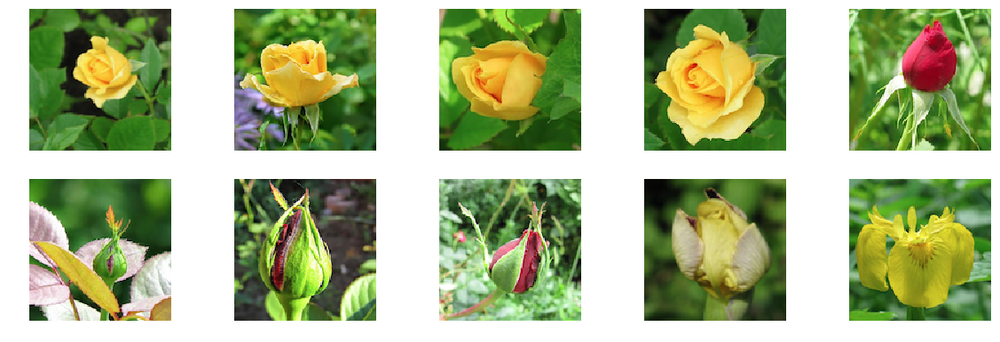

In [43]:
os.chdir(data_dir)

print("cluster 16")
print(groups[16])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[16]) >= 10 else len(groups[16])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[16][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 17
['08_006.png', '10_001.png', '10_004.png', '10_005.png', '10_006.png', '10_015.png', '10_016.png', '10_017.png', '10_019.png', '10_021.png', '10_023.png', '17_016.png', '17_034.png']


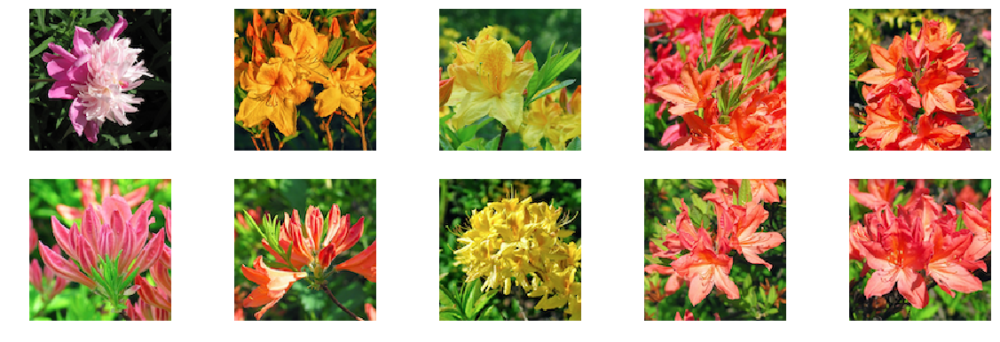

In [44]:
os.chdir(data_dir)

print("cluster 17")
print(groups[17])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[17]) >= 10 else len(groups[17])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[17][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 18
['02_024.png', '04_001.png', '04_004.png', '04_013.png', '04_017.png', '04_018.png', '04_025.png', '16_033.png', '17_004.png', '17_006.png', '17_007.png', '17_008.png', '17_009.png', '17_010.png', '17_011.png', '17_013.png', '17_015.png', '17_017.png', '17_018.png', '17_021.png', '17_022.png', '17_023.png', '17_026.png', '17_027.png', '17_031.png', '17_038.png', '18_003.png', '18_004.png', '18_006.png', '18_007.png', '18_009.png', '18_010.png', '18_013.png', '18_014.png', '18_035.png']


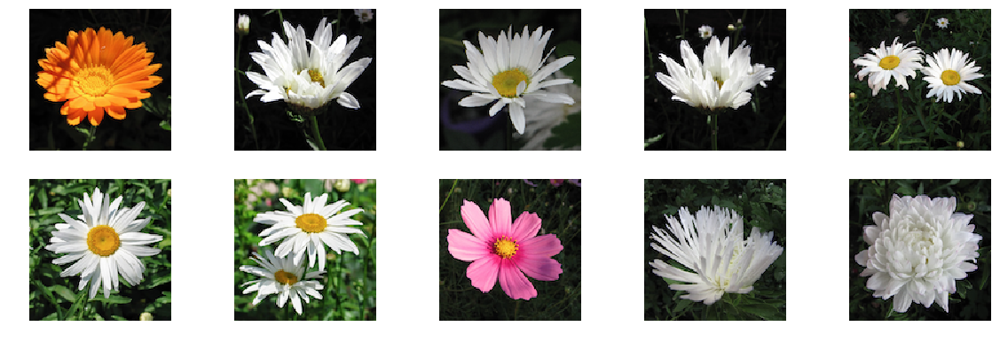

In [45]:
os.chdir(data_dir)

print("cluster 18")
print(groups[18])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[18]) >= 10 else len(groups[18])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[18][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      

cluster 19
['00_002.png', '00_005.png', '00_007.png', '00_009.png', '00_012.png', '00_016.png', '00_019.png', '00_024.png', '00_026.png', '00_027.png', '00_028.png', '00_031.png', '00_032.png', '00_033.png', '00_036.png', '00_038.png', '00_039.png', '00_040.png', '00_041.png', '00_043.png', '00_044.png', '03_005.png', '03_019.png', '03_023.png', '03_026.png', '03_030.png', '03_043.png', '05_033.png', '06_006.png', '06_019.png', '06_030.png', '10_002.png', '16_010.png', '16_015.png', '16_016.png', '16_017.png', '16_041.png']


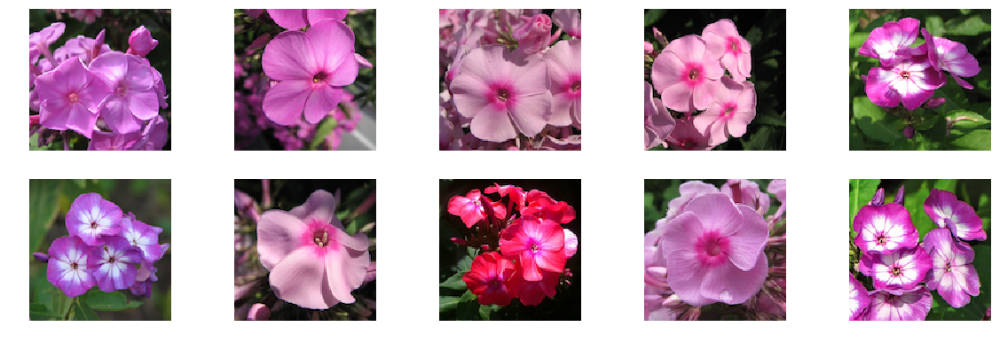

In [46]:
os.chdir(data_dir)

print("cluster 19")
print(groups[19])


plt.figure(figsize=(20,10))

numberOfPlots = 10 if len(groups[19]) >= 10 else len(groups[19])
count = 0
clusterIndex = 0
columns = 5


for i in range(numberOfPlots):
    image = PIL.Image.open(groups[19][i])
    plt.subplot(numberOfPlots / columns + 1, columns, i + 1)
    plt.imshow(image)
    plt.axis("off")
    
    count += 1      